## Práctica0 Machine Learning

# Modelización mediante árboles de decisión

### Objetivo del trabajo

Esta práctica tiene como objetivo realizar una primera modelización de machine learning, utilizando los árboles de decisión para modelizar un conjunto de datos relativo a préstamos bancarios.

Asimismo, como objetivo secundario se persigue determinar si la modelización mediante este clasificador es consistente si se varía la muestra utilizada para entrenar el modelo.

### 00. Carga de las librerías necesarias

In [1]:
# Carga librerias básicas necesarias
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings("ignore")

In [2]:
# Carga librerias necesarias modelización, predicción e indicadores
from sklearn.utils import resample
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler, OneHotEncoder, LabelEncoder 
from sklearn.model_selection import train_test_split
from sklearn import tree
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score, recall_score, precision_score, roc_curve, f1_score, confusion_matrix

In [3]:
# Carga librerias necesarias representación del árbol de decisión
from sklearn.tree import export_graphviz
from six import StringIO  
from IPython.display import Image  
import pydotplus

### 01. Lectura de datos y visualización del data frame

In [4]:
# Lectura de datos
df_selected = pd.read_csv('data/df_selected.csv')

In [5]:
# Tamaño del data frame
df_selected.shape

(442335, 35)

In [6]:
# Estadísticos descritivos básicos de las variables del data frame
df_selected.describe(include = 'all')

,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_length,home_ownership,...,application_type,acc_open_past_24mths,mort_acc,pub_rec_bankruptcies,tax_liens,disbursement_method,issue_month,issue_year,earliest_cr_year,credit_history
count,442335.000000,442335.000000,442335.000000,442335.000000,442335.000000,442335.000000,442335,442335,442335.000000,442335,...,442335.000000,442335.000000,442335.000000,442335.000000,442335.000000,442335.000000,442335,442335.000000,442335.000000,442335.000000
unique,NaN,NaN,NaN,NaN,NaN,NaN,7,35,NaN,4,...,NaN,NaN,NaN,NaN,NaN,NaN,12,NaN,NaN,NaN
top,NaN,NaN,NaN,NaN,NaN,NaN,C,C1,NaN,MORTGAGE,...,NaN,NaN,NaN,NaN,NaN,NaN,Oct,NaN,NaN,NaN
freq,NaN,NaN,NaN,NaN,NaN,NaN,124885,26548,NaN,220364,...,NaN,NaN,NaN,NaN,NaN,NaN,56111,NaN,NaN,NaN
mean,14566.416856,14566.416856,14561.066882,42.140378,13.255884,439.935320,NaN,NaN,5.767755,NaN,...,0.002258,4.795908,1.776111,0.147868,0.056475,0.000020,NaN,2014.599414,1998.159006,16.440408
std,8500.018979,8500.018979,8496.756229,10.472109,4.471144,252.505972,NaN,NaN,3.722447,NaN,...,0.047470,3.143748,2.089641,0.397284,0.419215,0.004511,NaN,0.670304,7.464446,7.429709
min,1000.000000,1000.000000,900.000000,36.000000,5.320000,14.010000,NaN,NaN,0.000000,NaN,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,NaN,2014.000000,1944.000000,3.000000
25%,8000.000000,8000.000000,8000.000000,36.000000,9.990000,256.900000,NaN,NaN,2.000000,NaN,...,0.000000,3.000000,0.000000,0.000000,0.000000,0.000000,NaN,2014.000000,1994.000000,11.000000
50%,12500.000000,12500.000000,12500.000000,36.000000,12.990000,378.760000,NaN,NaN,6.000000,NaN,...,0.000000,4.000000,1.000000,0.000000,0.000000,0.000000,NaN,2015.000000,2000.000000,15.000000
75%,20000.000000,20000.000000,20000.000000,60.000000,15.990000,579.720000,NaN,NaN,10.000000,NaN,...,0.000000,6.000000,3.000000,0.000000,0.000000,0.000000,NaN,2015.000000,2003.000000,20.000000


In [7]:
# Tipo de variables
df_selected.dtypes

loan_amnt               float64
funded_amnt             float64
funded_amnt_inv         float64
term                      int64
int_rate                float64
installment             float64
grade                    object
sub_grade                object
emp_length                int64
home_ownership           object
annual_inc              float64
verification_status       int64
loan_status               int64
purpose                  object
addr_state               object
dti                     float64
delinq_2yrs             float64
fico_range_low          float64
fico_range_high         float64
open_acc                float64
pub_rec                 float64
revol_bal               float64
revol_util              float64
total_acc               float64
initial_list_status       int64
application_type          int64
acc_open_past_24mths    float64
mort_acc                float64
pub_rec_bankruptcies    float64
tax_liens               float64
disbursement_method       int64
issue_mo

### 02. Codificación de las variables categóricas del dataset

Debido a que la modelización con árboles de decisión no admite variables categóricas, estas se deben identificar y transformar para poder ser tratadas posteriormente en el modelo.

In [8]:
#Obtención de las variables categoricas del data frame
list_categorical_features = []
for i in df_selected.columns:
    if (df_selected[i].dtype!='float64') & (df_selected[i].dtype!='int64'):
        list_categorical_features.append(i)

print(list_categorical_features)

['grade', 'sub_grade', 'home_ownership', 'purpose', 'addr_state', 'issue_month']


In [9]:
#Visualización de las columnas categoricas del dataset
print(df_selected[list_categorical_features])

       grade sub_grade home_ownership             purpose addr_state  \
0          A        A4            OWN         credit_card         CA   
1          E        E3           RENT  debt_consolidation         WA   
2          A        A4       MORTGAGE  debt_consolidation         TX   
3          C        C5           RENT  debt_consolidation         CA   
4          C        C5       MORTGAGE  debt_consolidation         MA   
...      ...       ...            ...                 ...        ...   
442330     D        D1           RENT         credit_card         TX   
442331     B        B5       MORTGAGE         credit_card         OH   
442332     D        D2           RENT  debt_consolidation         TN   
442333     E        E3           RENT  debt_consolidation         MA   
442334     B        B5           RENT         credit_card         FL   

       issue_month  
0              Jun  
1              Jun  
2              Jun  
3              Jun  
4              Jun  
...      

Se utilizarán dos tipos de codificación para las columnas:
- Las variables categóricas de tipo ordinal, serán transformadas a una escala numérica
- Las variables categóricas de tipo nominal, serán transformadas utilizando el método de one hot encoding

#### Codificación de las variables categóricas de tipo ordinal

In [10]:
# Obtenemos los valores únicos de la columna grade
print(df_selected['grade'].unique())

['A' 'E' 'C' 'G' 'B' 'D' 'F']


In [11]:
# Obtenemos los valores únicos de la columna sub_grade
print(df_selected['sub_grade'].unique())

['A4' 'E3' 'C5' 'G1' 'B5' 'B4' 'B1' 'B3' 'D5' 'B2' 'C2' 'E2' 'C4' 'A1'
 'E1' 'C3' 'D1' 'G3' 'A3' 'C1' 'A5' 'D3' 'D2' 'E5' 'F3' 'A2' 'D4' 'G2'
 'F2' 'E4' 'G4' 'F4' 'F1' 'F5' 'G5']


In [12]:
# Codificamos las variables, estableciendo una escala numérica (relacionando además el grade y el sub_grade)
df_selected['grade'] = df_selected['grade'].map({'A': 7, 'B': 6, 'C':5, 'D': 4, 'E': 3, 'F': 2, 'G': 1}).astype(int)
df_selected['sub_grade'] = df_selected['sub_grade']\
                            .map({'A1': 7 + (0.9 * 5/5), 'A2': 7 + (0.9 * 4/5), 'A3': 7 + (0.9 * 3/5), 'A4': 7 + (0.9 * 2/5), 'A5': 7 + (0.9 * 1/5),
                                'B1': 6 + (0.9 * 5/5), 'B2': 6 + (0.9 * 4/5), 'B3': 6 + (0.9 * 3/5), 'B4': 6 + (0.9 * 2/5), 'B5': 6 + (0.9 * 1/5),
                                'C1': 5 + (0.9 * 5/5), 'C2': 5 + (0.9 * 4/5), 'C3': 5 + (0.9 * 3/5), 'C4': 5 + (0.9 * 2/5), 'C5': 5 + (0.9 * 1/5),
                                'D1': 4 + (0.9 * 5/5), 'D2': 4 + (0.9 * 4/5), 'D3': 4 + (0.9 * 3/5), 'D4': 4 + (0.9 * 2/5), 'D5': 4 + (0.9 * 1/5),
                                'E1': 3 + (0.9 * 5/5), 'E2': 3 + (0.9 * 4/5), 'E3': 3 + (0.9 * 3/5), 'E4': 3 + (0.9 * 2/5), 'E5': 3 + (0.9 * 1/5),
                                'F1': 2 + (0.9 * 5/5), 'F2': 2 + (0.9 * 4/5), 'F3': 2 + (0.9 * 3/5), 'F4': 2 + (0.9 * 2/5), 'F5': 2 + (0.9 * 1/5),
                                'G1': 1 + (0.9 * 5/5), 'G2': 1 + (0.9 * 4/5), 'G3': 1 + (0.9 * 3/5), 'G4': 1 + (0.9 * 2/5), 'G5': 1 + (0.9 * 1/5),}).astype(float)

#### Codificación de las variables categóricas de tipo nominal

In [13]:
# Nos quedamos unicamente con las variables categoricas nominales para hacer la codificación one hot
list_categorical_features.remove('grade')
list_categorical_features.remove('sub_grade')
list_categorical_features

['home_ownership', 'purpose', 'addr_state', 'issue_month']

In [14]:
# Aplicamos one hot encoding a las columnas categóricas del data frame
df_selected = pd.get_dummies(df_selected, columns = list_categorical_features)
# Visualizamos el data set una vez realizadas las transformaciones
df_selected

,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_length,annual_inc,...,issue_month_Dec,issue_month_Feb,issue_month_Jan,issue_month_Jul,issue_month_Jun,issue_month_Mar,issue_month_May,issue_month_Nov,issue_month_Oct,issue_month_Sep
0,11575.0,11575.0,11575.0,36,7.35,359.26,7,7.36,6,153000.0,...,0,0,0,0,1,0,0,0,0,0
1,7200.0,7200.0,7200.0,36,24.85,285.70,3,3.54,2,50000.0,...,0,0,0,0,1,0,0,0,0,0
2,7500.0,7500.0,7500.0,36,7.35,232.79,7,7.36,7,110000.0,...,0,0,0,0,1,0,0,0,0,0
3,10000.0,10000.0,10000.0,60,16.02,243.29,5,5.18,7,51979.0,...,0,0,0,0,1,0,0,0,0,0
4,14000.0,14000.0,14000.0,36,16.02,492.34,5,5.18,7,75000.0,...,0,0,0,0,1,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
442330,11575.0,11575.0,11575.0,36,15.59,404.61,4,4.90,10,25400.0,...,0,0,1,0,0,0,0,0,0,0
442331,12000.0,12000.0,12000.0,36,11.99,398.52,6,6.18,1,63000.0,...,0,0,1,0,0,0,0,0,0,0
442332,13000.0,13000.0,13000.0,60,15.99,316.07,4,4.72,5,35000.0,...,0,0,1,0,0,0,0,0,0,0
442333,12000.0,12000.0,12000.0,60,19.99,317.86,3,3.54,1,64400.0,...,0,0,1,0,0,0,0,0,0,0


In [15]:
# Nuevo tamaño del data frame
df_selected.shape

(442335, 112)

### 03. Proporcionalidad de la variable objetivo en la muestra

In [16]:
# Obtenemos el número de observaciones de cada valor de la variable objetivo
df_selected.loan_status.value_counts()

0    345335
1     97000
Name: loan_status, dtype: int64

In [17]:
# Como están descompensados, generamos los df auxiliares para poder balancear los casos
df_major = df_selected[df_selected.loan_status == 0]
df_minor = df_selected[df_selected.loan_status == 1]

In [18]:
# Realizamos un upsample, para aumentar el numero de casos positivos que estaba menos representado
df_minor_upsmapled = resample(df_minor, replace = True, n_samples = 358436, random_state = 12345)

In [19]:
# Volvemos a unir ambos df auxiliares
df_minor_upsmapled = pd.concat([df_minor_upsmapled, df_major])

In [20]:
# Comprobamos que ahora sí el número de casos de cada valor distinto de la variable objetivo están balanceados
df_minor_upsmapled.loan_status.value_counts()

1    358436
0    345335
Name: loan_status, dtype: int64

In [21]:
# Comprobamos el tipo de las variables antes de modelizar
df_minor_upsmapled.dtypes

loan_amnt          float64
funded_amnt        float64
funded_amnt_inv    float64
term                 int64
int_rate           float64
                    ...   
issue_month_Mar      uint8
issue_month_May      uint8
issue_month_Nov      uint8
issue_month_Oct      uint8
issue_month_Sep      uint8
Length: 112, dtype: object

### 04. Modelización  

In [22]:
# Seleccionamos una muestra aleatoria dentro del dataset para facilitar el trabajo computacional
df_minor_upsmapled_short = df_minor_upsmapled.sample(n=5000, random_state=1234)

In [23]:
# Dividimos el dataset entre la variable objetivo y las variables explicativas
X = df_minor_upsmapled_short.drop('loan_status', axis = 1)
Y = df_minor_upsmapled_short.loan_status

In [24]:
# Dividimos la muestra en train y test
xtrain, xtest, ytrain, ytest = train_test_split(X, Y, test_size=0.25, random_state=0)

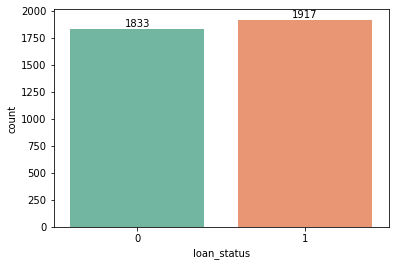

In [25]:
# Representamos los valores de la variable objetivo recogidos en la muestra de entrenamiento
sns.set_palette("Set2")
ax =sns.countplot(ytrain)
for container in ax.containers:
    ax.bar_label(container)

In [26]:
# Seleccionamos el modelo a utilizar y entrenamos el modelo con la muestra seleccionada para entrenamiento
model = tree.DecisionTreeClassifier()
train_model = model.fit(xtrain, ytrain)

In [27]:
# Visualizamos el arbol de decisión generado por el modelo
feature_cols = list(xtrain.columns)
dot_data = StringIO()
export_graphviz(train_model, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True,feature_names = feature_cols,class_names=['0','1'])
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
graph.write_png('images/model_train_tree.png')
Image(graph.create_png())

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.891474 to fit

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.891474 to fit



### 05. Análisis de las variables más importantes del modelo

In [28]:
# Extraemos los pesos de cada variable en el modelo y generamos un data frame para su posterior representación gráfica
importances = model.feature_importances_
pd_series_importances = pd.Series(importances, index=feature_cols)
pd_df_importances = pd_series_importances.to_frame().reset_index()
pd_df_importances = pd_df_importances.rename({'index' : 'feature', 0: 'importance'}, axis=1)
pd_df_importances = pd_df_importances.set_index('feature')
pd_df_importances

,importance
feature,
loan_amnt,0.015963
funded_amnt,0.015610
funded_amnt_inv,0.021869
term,0.015099
int_rate,0.035611
...,...
issue_month_Mar,0.002848
issue_month_May,0.004128
issue_month_Nov,0.003990


<AxesSubplot:xlabel='feature'>

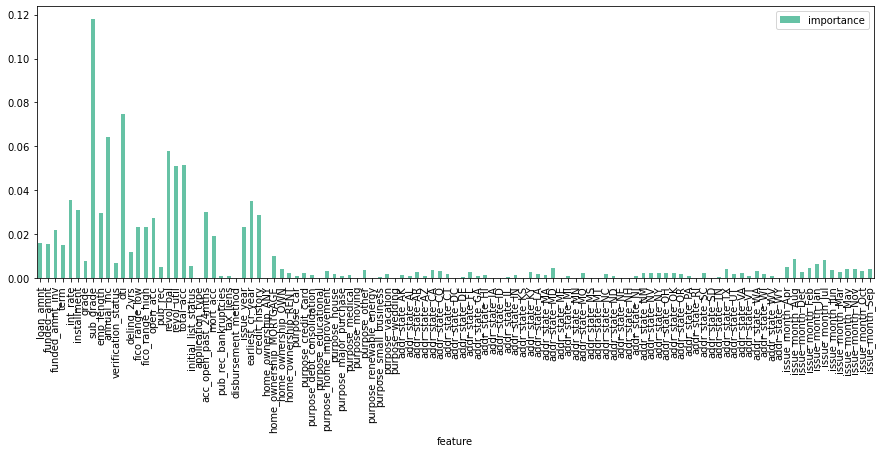

In [29]:
# Representamos mediante un gráfico de barras la importancia de cada una de las variables sobre el modelo
fig, ax = plt.subplots(figsize=(15, 5))
pd_df_importances.plot.bar(ax=ax)

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12]),
 [Text(0, 0, 'int_rate'),
  Text(1, 0, 'installment'),
  Text(2, 0, 'sub_grade'),
  Text(3, 0, 'emp_length'),
  Text(4, 0, 'annual_inc'),
  Text(5, 0, 'dti'),
  Text(6, 0, 'open_acc'),
  Text(7, 0, 'revol_bal'),
  Text(8, 0, 'revol_util'),
  Text(9, 0, 'total_acc'),
  Text(10, 0, 'acc_open_past_24mths'),
  Text(11, 0, 'earliest_cr_year'),
  Text(12, 0, 'credit_history')])

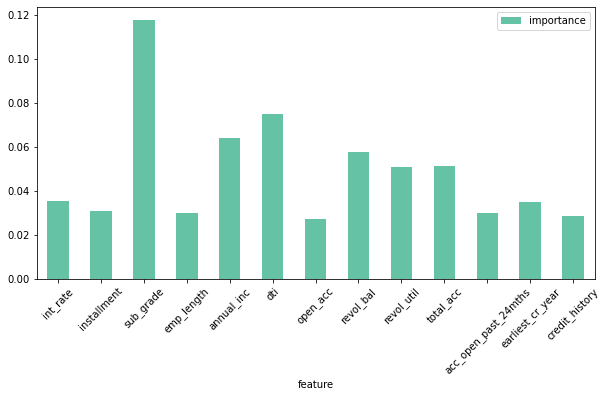

In [30]:
# Para visualizar mejor, únicamente representamos aquellas variables con una importancia mayor al 0.025
pd_df_importances_filter = pd_df_importances[pd_df_importances.importance > 0.025]

fig, ax = plt.subplots(figsize=(10, 5))
pd_df_importances_filter.plot.bar(ax=ax)
plt.xticks(rotation=45)

### 06. Predicción del modelo

In [31]:
#Predicción de la cuarta posición del test  
train_model.predict(xtest.iloc[[3,]])

array([0], dtype=int64)

In [32]:
# Predicción de todo el conjunto de test
y_pred = train_model.predict(xtest)

### 07. Indicadores sobre la predicción del modelo

#### Ratios

In [33]:
print("Accuracy:",accuracy_score(ytest, y_pred))

Accuracy: 0.5824


In [34]:
print("Recall:",recall_score(ytest, y_pred))

Recall: 0.5778120184899846


In [35]:
print("Precision:",precision_score(ytest, y_pred))

Precision: 0.6019261637239165


In [36]:
print('F-Score: %.5f' % f1_score(ytest, y_pred))

F-Score: 0.58962


#### Matrices de confusión

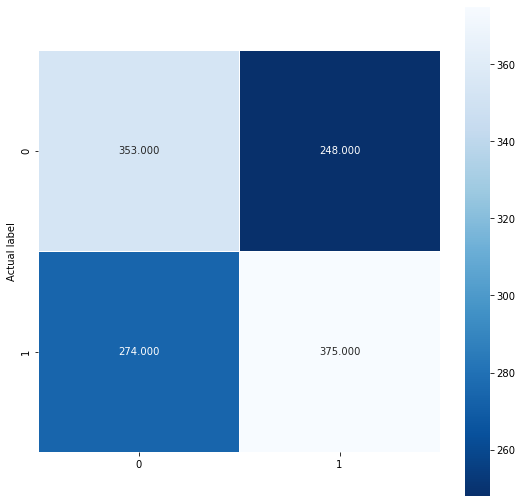

In [37]:
# Matriz de confusion valores absolutos
cm = confusion_matrix(ytest, y_pred)
plt.figure(figsize=(9,9))
sns.heatmap(cm, annot=True, fmt=".3f", linewidths=.5, square = True, cmap = 'Blues_r');
plt.ylabel('Actual label');

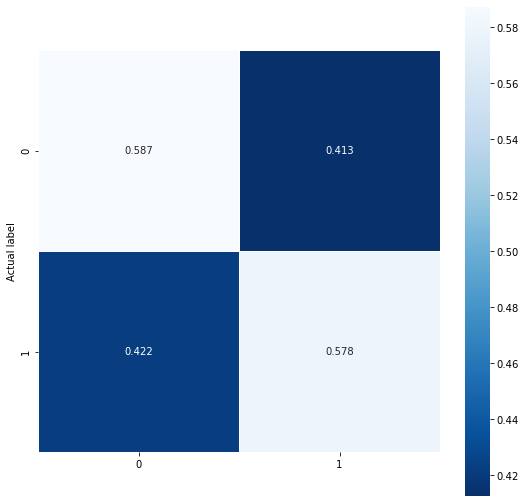

In [38]:
# Matriz de confusion normalizada
cmn = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
plt.figure(figsize=(9,9))
sns.heatmap(cmn, annot=True, fmt=".3f", linewidths=.5, square = True, cmap = 'Blues_r');
plt.ylabel('Actual label');

#### Curva ROC

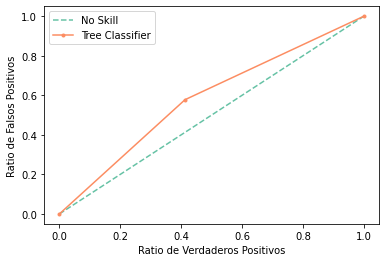

In [39]:
prob_predictions = train_model.predict_proba(xtest)
yhat = prob_predictions[:, 1]
# Calculamos los domponentes de la curva ROC
fpr, tpr, thresholds = roc_curve(ytest, yhat)
# Gráficamos la curva ROC del modelo
plt.plot([0,1], [0,1], linestyle='--', label='No Skill')
plt.plot(fpr, tpr, marker='.', label='Tree Classifier')
# Labels
plt.xlabel('Ratio de Verdaderos Positivos')
plt.ylabel('Ratio de Falsos Positivos')
plt.legend()

### 08. Probamos la consistencia del modelo cambiando la muestra train y test

#### Modelización

In [40]:
# Modificamos la muestra modificando la semilla
xtrain, xtest, ytrain, ytest = train_test_split(X, Y, test_size=0.25, random_state=12345)

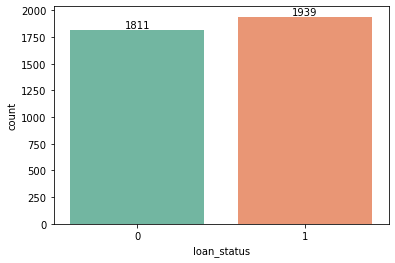

In [41]:
# Representamos los valores de la variable objetivo recogidos en la muestra de entrenamiento
sns.set_palette("Set2")
ax =sns.countplot(ytrain)
for container in ax.containers:
    ax.bar_label(container)

In [42]:
# model = tree.DecisionTreeClassifier() se ha definido previamente
train_model = model.fit(xtrain, ytrain)

In [43]:
# Visualizamos el árbol de decisión generado
feature_cols = list(xtrain.columns)

dot_data = StringIO()
export_graphviz(train_model, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True,feature_names = feature_cols,class_names=['0','1'])
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
graph.write_png('images/model_train_tree2.png')
Image(graph.create_png())

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.934491 to fit

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.934491 to fit



#### Análisis de las variables más importantes del modelo

In [44]:
# Extraemos los pesos de cada variable en el modelo y generamos un data frame para su posterior representación gráfica
importances = model.feature_importances_
pd_series_importances = pd.Series(importances, index=feature_cols)
pd_df_importances = pd_series_importances.to_frame().reset_index()
pd_df_importances = pd_df_importances.rename({'index' : 'feature', 0: 'importance'}, axis=1)
pd_df_importances = pd_df_importances.set_index('feature')
pd_df_importances

,importance
feature,
loan_amnt,0.010313
funded_amnt,0.013660
funded_amnt_inv,0.024326
term,0.010024
int_rate,0.048971
...,...
issue_month_Mar,0.001916
issue_month_May,0.002456
issue_month_Nov,0.007905


<AxesSubplot:xlabel='feature'>

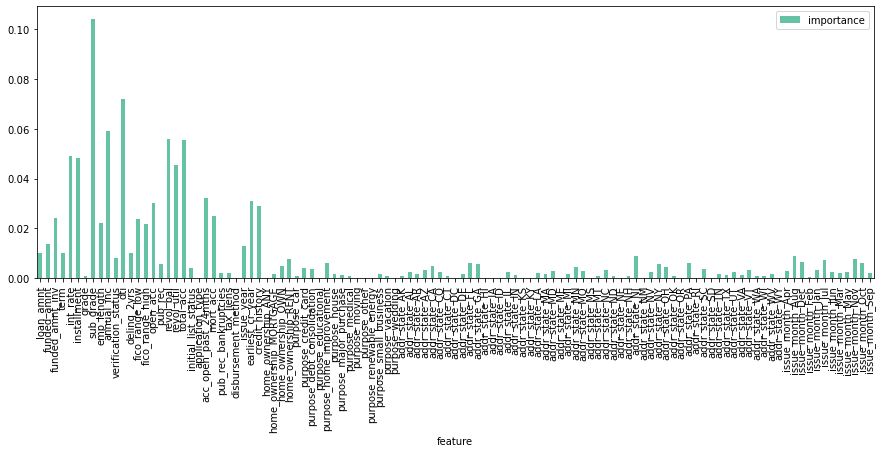

In [45]:
# Representamos mediante un gráfico de barras la importancia de cada una de las variables sobre el modelo
fig, ax = plt.subplots(figsize=(15, 5))
pd_df_importances.plot.bar(ax=ax)

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12]),
 [Text(0, 0, 'int_rate'),
  Text(1, 0, 'installment'),
  Text(2, 0, 'sub_grade'),
  Text(3, 0, 'annual_inc'),
  Text(4, 0, 'dti'),
  Text(5, 0, 'open_acc'),
  Text(6, 0, 'revol_bal'),
  Text(7, 0, 'revol_util'),
  Text(8, 0, 'total_acc'),
  Text(9, 0, 'acc_open_past_24mths'),
  Text(10, 0, 'mort_acc'),
  Text(11, 0, 'earliest_cr_year'),
  Text(12, 0, 'credit_history')])

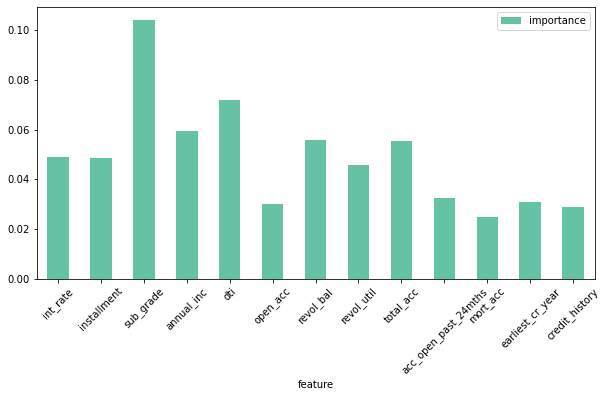

In [46]:
# Para visualizar mejor, únicamente representamos aquellas variables con una importancia mayor al 0.025
pd_df_importances_filter = pd_df_importances[pd_df_importances.importance > 0.025]

fig, ax = plt.subplots(figsize=(10, 5))
pd_df_importances_filter.plot.bar(ax=ax)
plt.xticks(rotation=45)

#### Predicción del modelo

In [47]:
#Predicción de la cuarta posición del test  
train_model.predict(xtest.iloc[[3,]])

array([0], dtype=int64)

In [48]:
# Predicción de todo el conjunto de test
y_pred = train_model.predict(xtest)

#### Indicadores sobre la predicción del modelo

In [49]:
# Ratios
print("Accuracy:",accuracy_score(ytest, y_pred))
print("Recall:",recall_score(ytest, y_pred))
print("Precision:",precision_score(ytest, y_pred))
print('F-Score: %.5f' % f1_score(ytest, y_pred))

Accuracy: 0.5808
Recall: 0.6188197767145136
Precision: 0.5765230312035661
F-Score: 0.59692


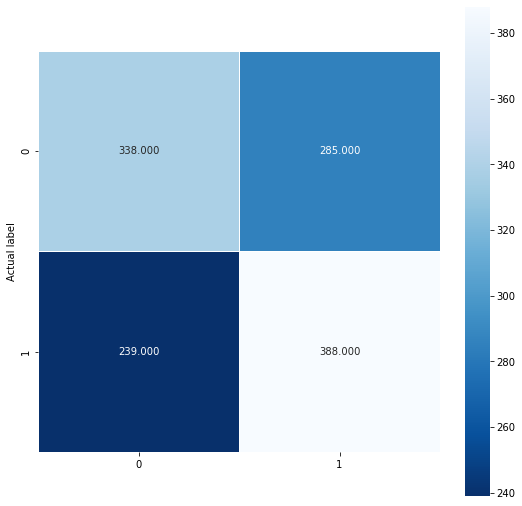

In [50]:
# Matriz de confusion valores absolutos
cm = confusion_matrix(ytest, y_pred)
plt.figure(figsize=(9,9))
sns.heatmap(cm, annot=True, fmt=".3f", linewidths=.5, square = True, cmap = 'Blues_r');
plt.ylabel('Actual label');

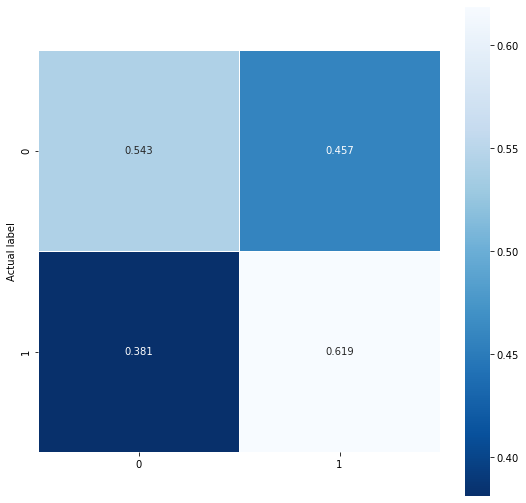

In [51]:
# Matriz de confusion normalizada
cmn = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
plt.figure(figsize=(9,9))
sns.heatmap(cmn, annot=True, fmt=".3f", linewidths=.5, square = True, cmap = 'Blues_r');
plt.ylabel('Actual label');

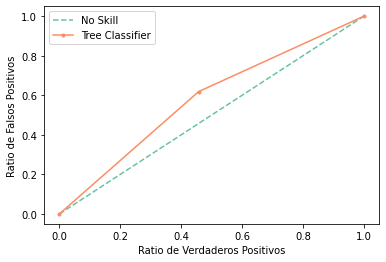

In [52]:
#Curva ROC
prob_predictions = train_model.predict_proba(xtest)
yhat = prob_predictions[:, 1]
# Calculamos los domponentes de la curva ROC
fpr, tpr, thresholds = roc_curve(ytest, yhat)
# Gráficamos la curva ROC del modelo
plt.plot([0,1], [0,1], linestyle='--', label='No Skill')
plt.plot(fpr, tpr, marker='.', label='Tree Classifier')
# Labels
plt.xlabel('Ratio de Verdaderos Positivos')
plt.ylabel('Ratio de Falsos Positivos')
plt.legend()

### 09. Conclusiones

La modelización mediante árboles de decisión tiene un escaso poder predictivo sobre el conjunto de datos utilizados, obteniendo valores muy reducidos en todos los indicadores.

Además, es inconsistente, ya que una variación en el conjunto de entrenamiento utilizado como muestra, provoca una elevada variación en el poder predictivo del modelo.